## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---

## 1. Compute the camera calibration using chessboard images

In [1]:
#import modules
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
from ipywidgets import widgets
%matplotlib inline

#### Find chessboard corners

couldn not find cornerss for ./camera_cal\calibration1.jpg


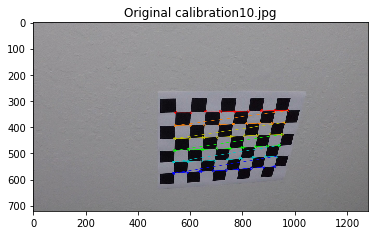

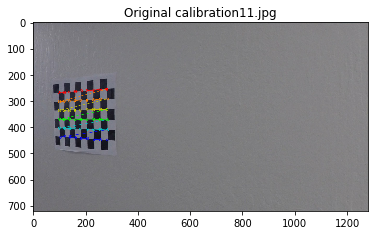

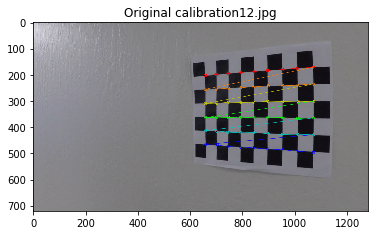

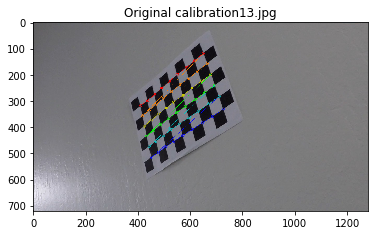

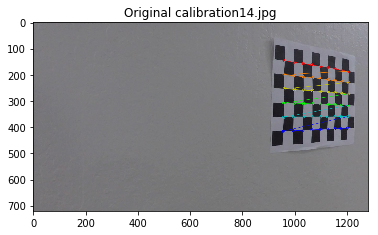

...

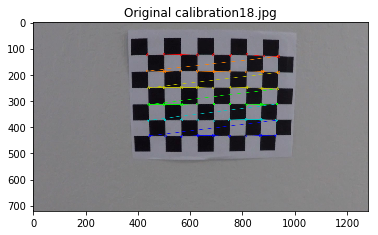

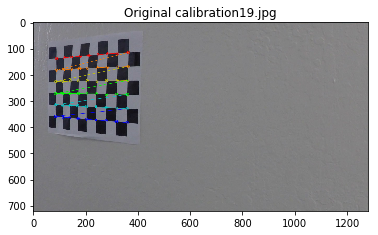

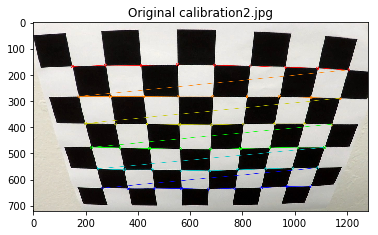

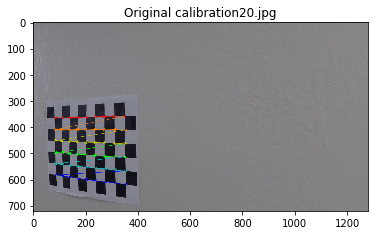

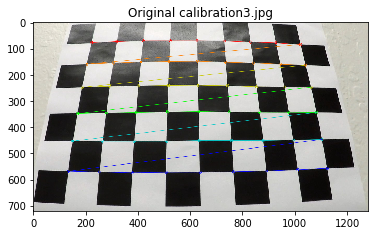

couldn not find cornerss for ./camera_cal\calibration4.jpg
couldn not find cornerss for ./camera_cal\calibration5.jpg


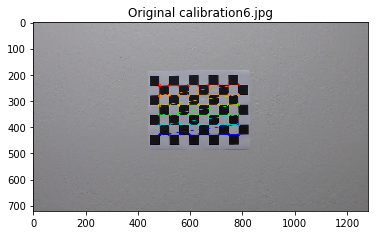

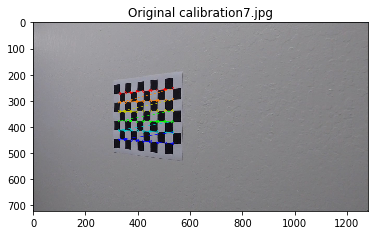

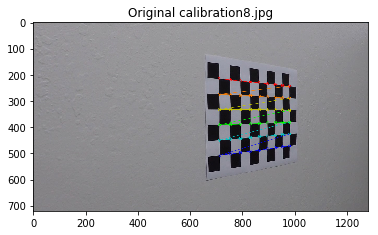

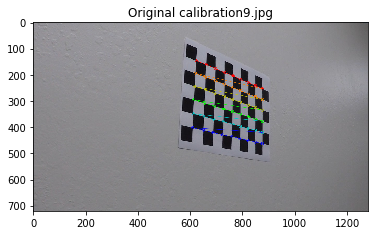

In [2]:
# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
nx = 9
ny = 6
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objPoints = [] # 3d points in real world space
imgPoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')
imgSize = cv2.imread(images[0]).shape[0:2]

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray,(nx,ny),None)

    # If found, add object points, image points
    if ret == True:
        objPoints.append(objp)
        imgPoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (nx,ny), corners, ret)
        imageName = fname.split('\\')[-1]
        fig = plt.figure()
        plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        plt.title('Original ' + imageName)
        plt.show()
        cv2.imwrite('./output_images/found_chessboard_corners/' + imageName,img)
    else:
        print('couldn not find cornerss for ' + fname)

#### Find camera calibration parmeters

In [3]:
# Camera calibration parameters
ret, mtx, dist, rvecs, tvecs, = cv2.calibrateCamera(objPoints,imgPoints,imgSize,None,None)
print('The distortion coeeficients are: ' , dist)

The distortion coeeficients are:  [[ -2.41018767e-01  -5.30665431e-02  -1.15811319e-03  -1.28284935e-04
    2.67026162e-02]]


#### Undistort chessboard images to visualize the calibration

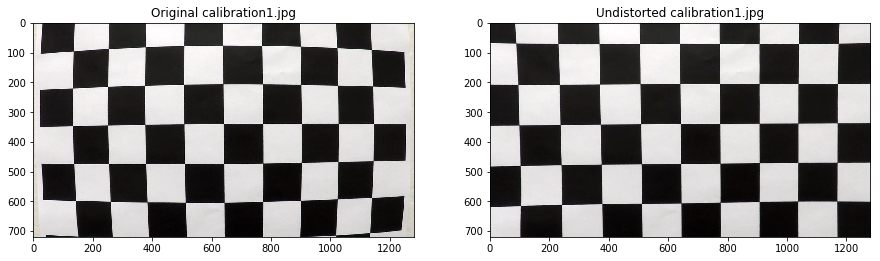

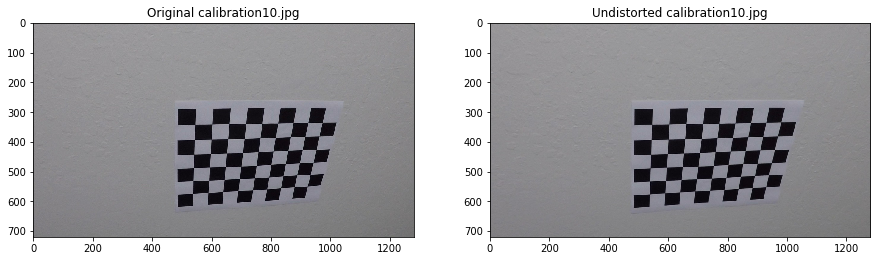

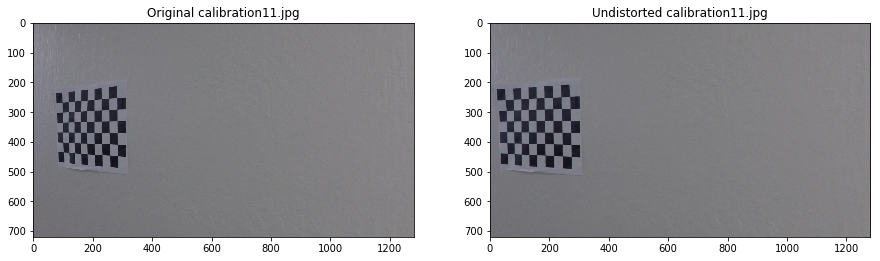

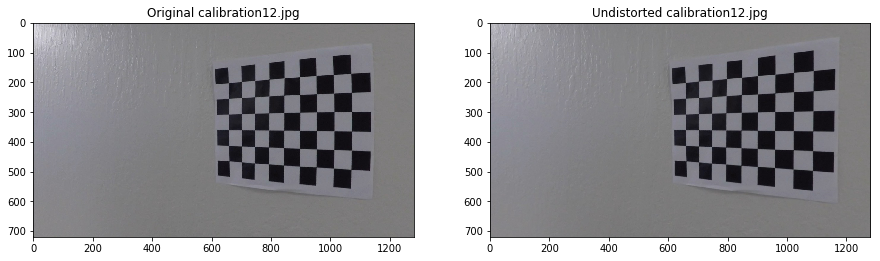

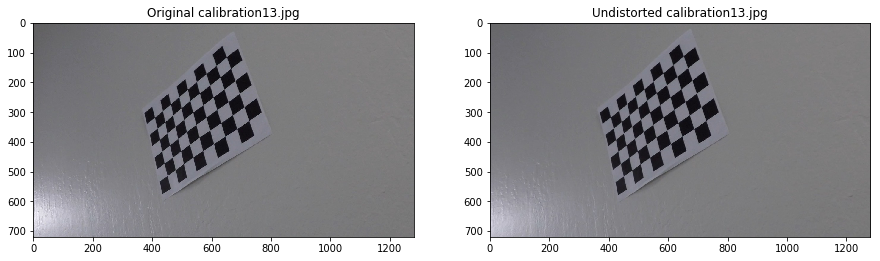

...

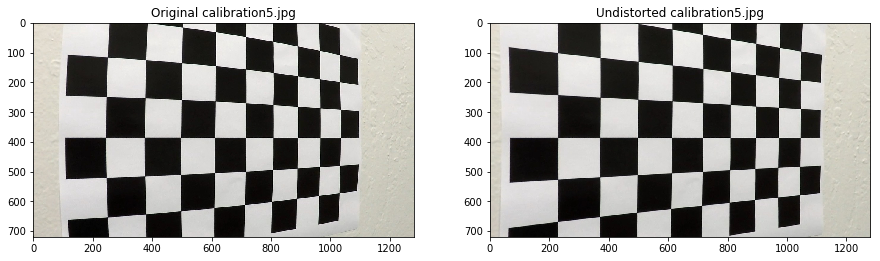

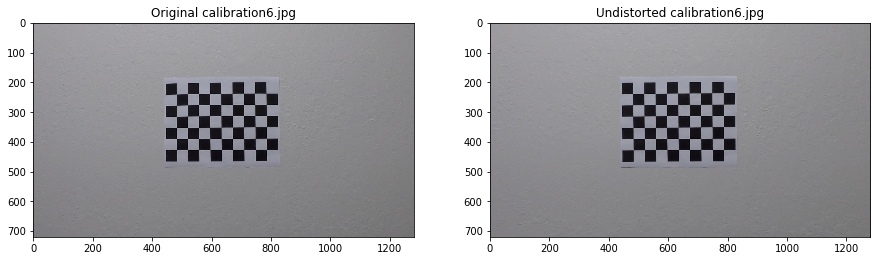

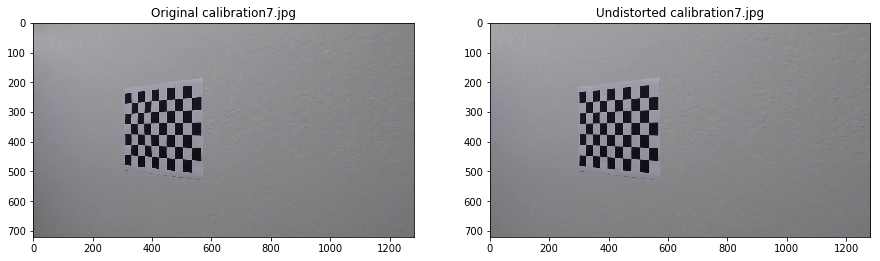

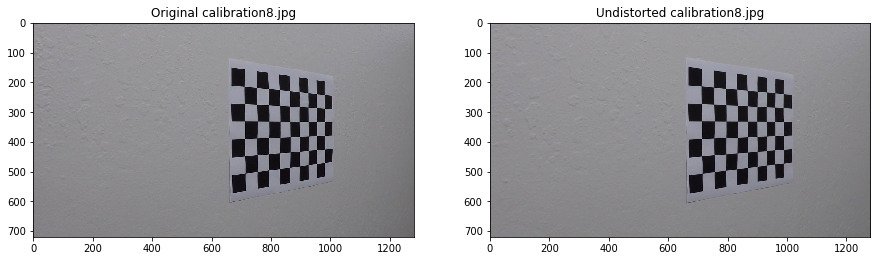

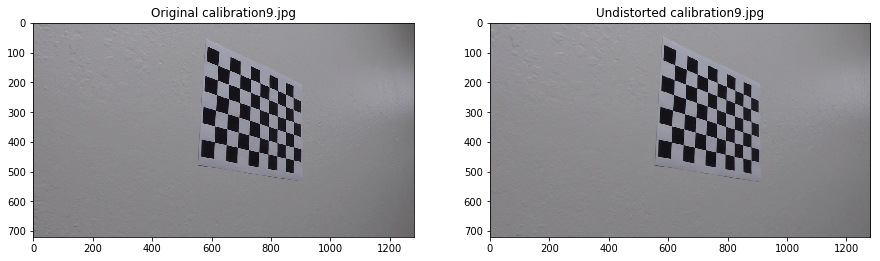

In [4]:
# Undistort the chessboard images in order to check the calibration
for fname in images:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted ' + imageName)
    plt.show()
    cv2.imwrite('./output_images/undistorted_chessboard/' + imageName,undistorted)

---

## 2. Undistort the raw test images

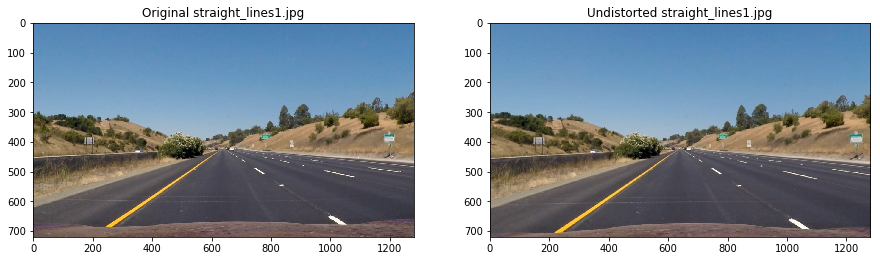

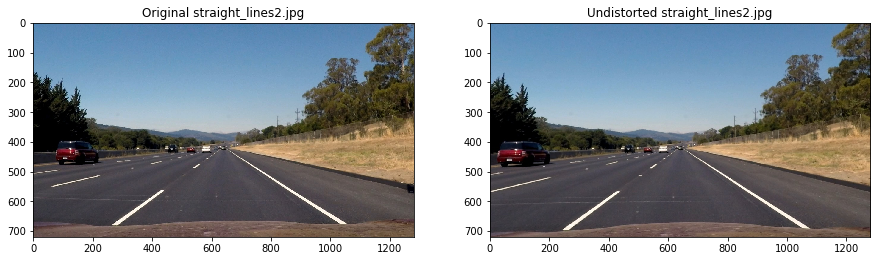

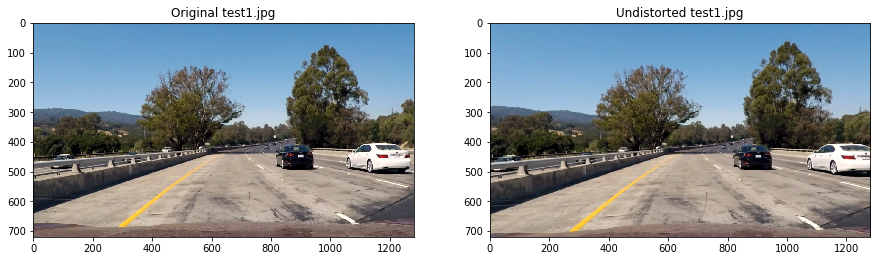

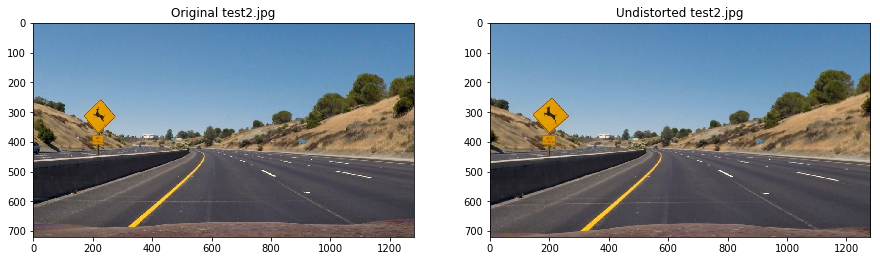

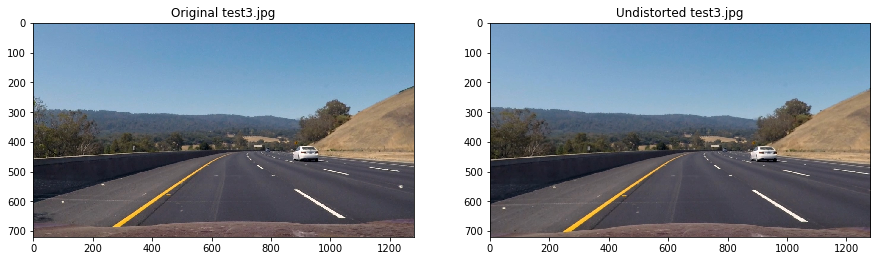

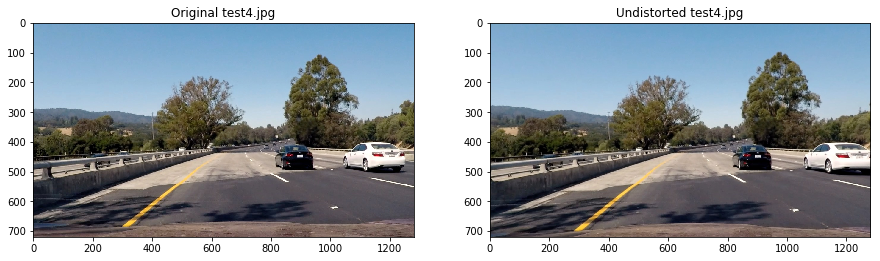

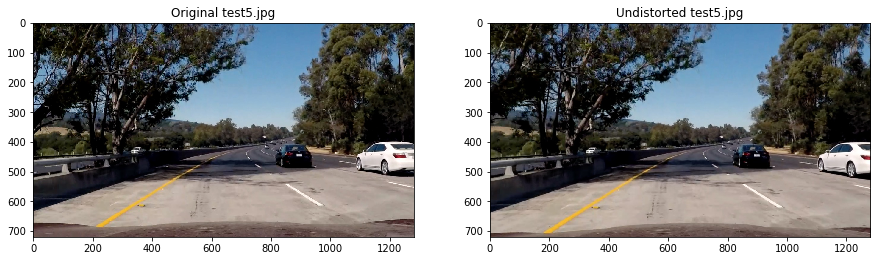

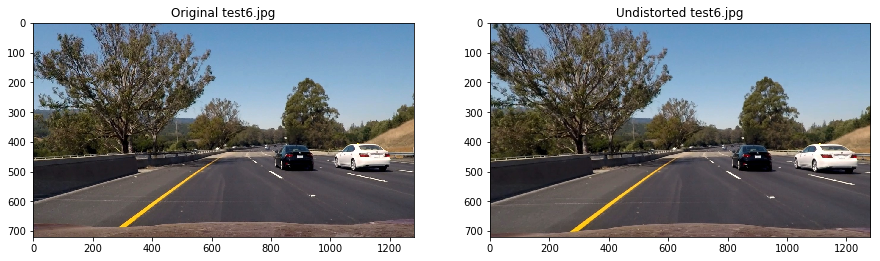

In [5]:
# Make a list of the test images
straightImgs = glob.glob('./test_images/straight_lines*.jpg')
testImgs = glob.glob('./test_images/test*.jpg')

# Undistort images and plot the original and undistorted images
for fname in straightImgs + testImgs:
    img = cv2.imread(fname)
    undistorted = cv2.undistort(img,mtx,dist,None,mtx)
    
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(undistorted, cv2.COLOR_BGR2RGB))
    plt.title('Undistorted ' + imageName)
    plt.show()
    cv2.imwrite('./output_images/undistorted_test_images/' + imageName,undistorted)


---

## 3. Color transforms and color & gradient thresholding

In [6]:
def bin_channel(channel,low_thresh=1,high_thresh=255):
    # Create a binary image of a channel based on high & low thrwsholds
    binary_out = np.zeros_like(channel,dtype=np.uint8)
    binary_out[(channel >= low_thresh) & (channel < high_thresh)] = 1
    return binary_out

#### Transform BGR to HLS and threshold over the S channel

<function __main__.handle>

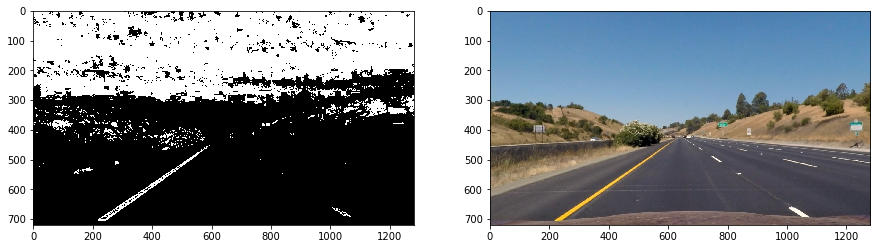

In [7]:
# Make a list of the undistorted test images
straightImgs = glob.glob('./output_images/undistorted_test_images/straight_lines*.jpg')
testImgs = glob.glob('./output_images/undistorted_test_images/test*.jpg')
images = straightImgs + testImgs
image = cv2.imread(images[0])
hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
sChannel = hls[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 100, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(sChannel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Transform BGR to HSV and threshold over the S channel

<function __main__.handle>

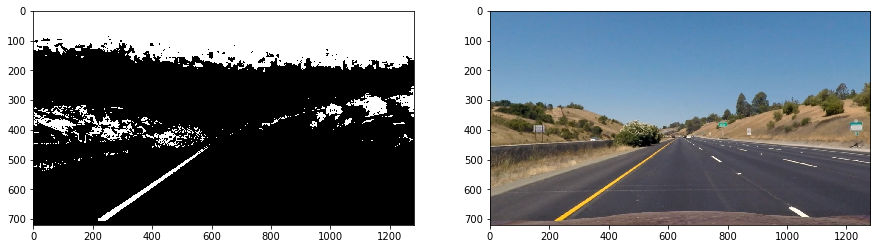

In [8]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
sChannel = hsv[:,:,1]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 120, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(sChannel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Threshold over the R channel

<function __main__.handle>

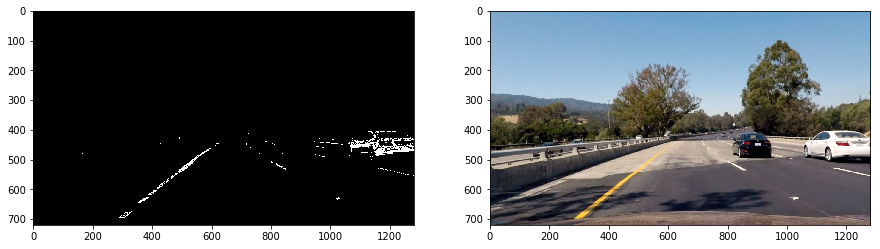

In [9]:
image = cv2.imread(images[5])
rChannel = image[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 230, min=0, max=255, step=1)

def handle(highThreshold, lowThreshold):
    binary_out = bin_channel(rChannel,lowThreshold,highThreshold)   
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider)

#### Add the S and R binaries

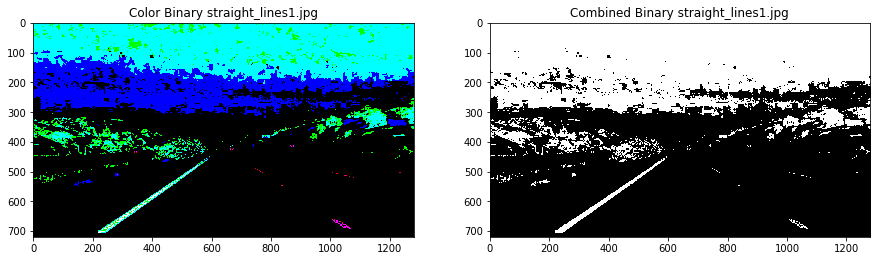

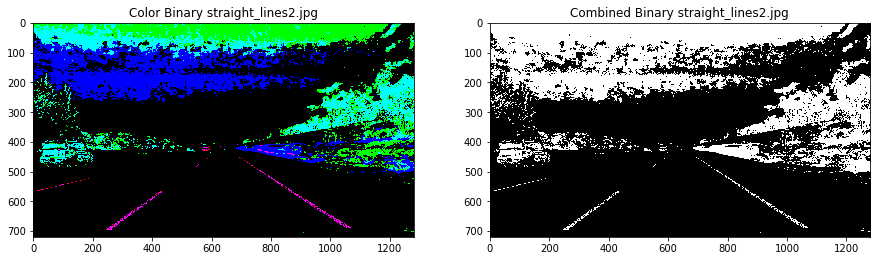

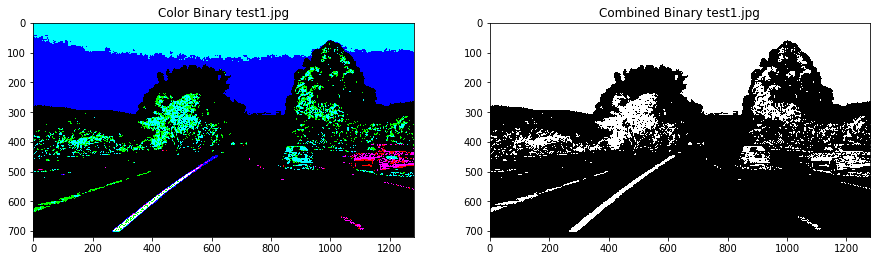

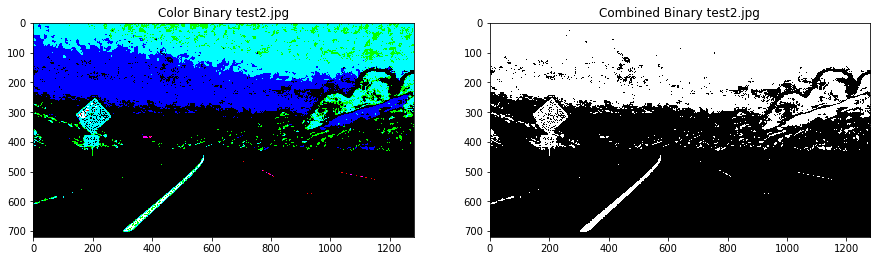

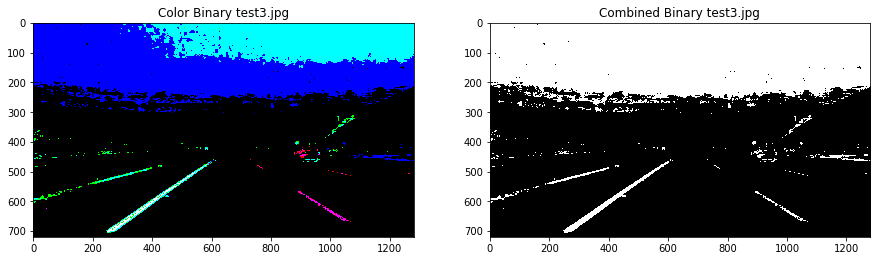

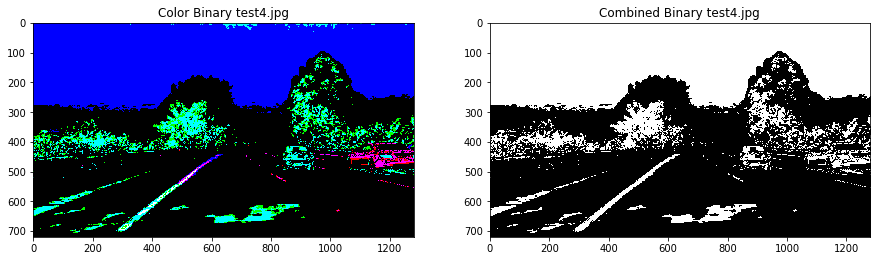

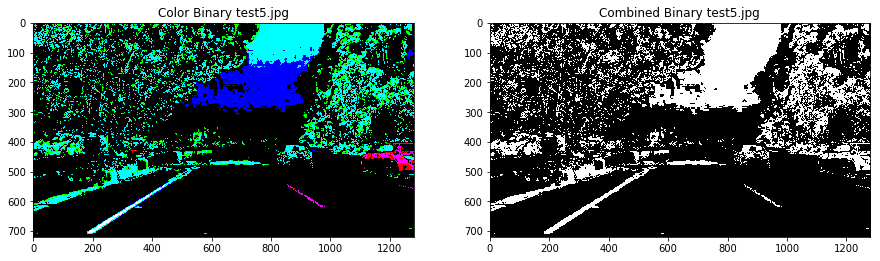

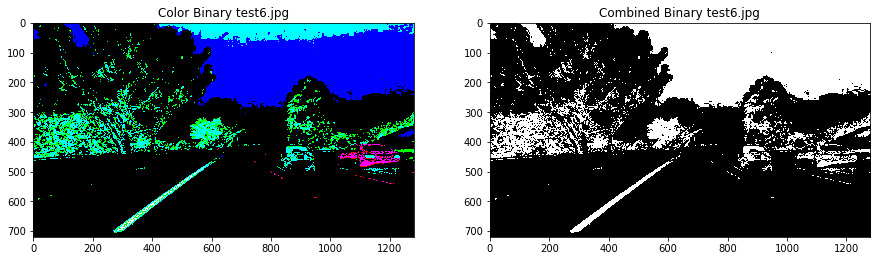

In [26]:
for fname in images:
    image = cv2.imread(fname)
    rChannel = image[:,:,2]
    hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    sChannel2 = hsv[:,:,1]

    red_bin = bin_channel(rChannel,230,255)
    s_bin = bin_channel(sChannel,100,255)
    s_bin2 = bin_channel(sChannel2,120,255)
    color_binary = np.dstack((red_bin*255, s_bin2*255, s_bin*255))
    combined_binary = red_bin | s_bin | s_bin2

    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(color_binary)
    plt.title('Color Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/color_combined_binary/' + imageName[:-3] + 'bmp',combined_binary*255)
    cv2.imwrite('./output_images/colored_binary/' + imageName,cv2.cvtColor(color_binary,cv2.COLOR_RGB2BGR))



#### Apply sobel in x direction (over V channel) and threshold over the output

<function __main__.handle>

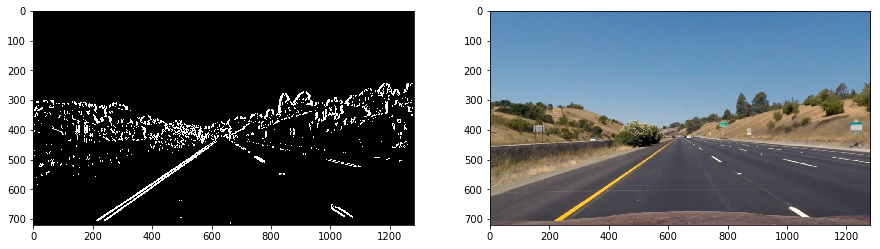

In [11]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 30, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobel = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint(255*abs_sobel/np.max(abs_sobel))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)


#### Apply sobel in y direction (over V channel) and threshold over the output

<function __main__.handle>

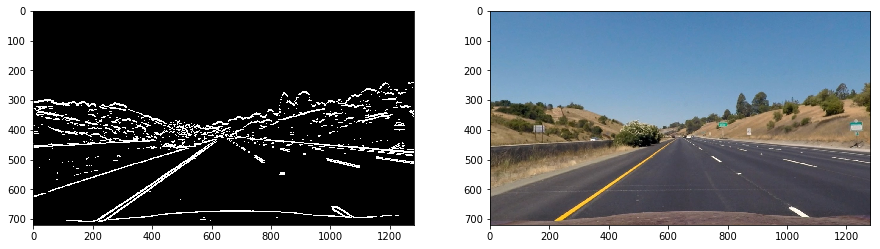

In [12]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 40, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobel = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    abs_sobel = np.absolute(sobel)
    scaled_sobel = np.uint(255*abs_sobel/np.max(abs_sobel))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Apply sobel in both direction (over V channel) and threshold over the magnitude

<function __main__.handle>

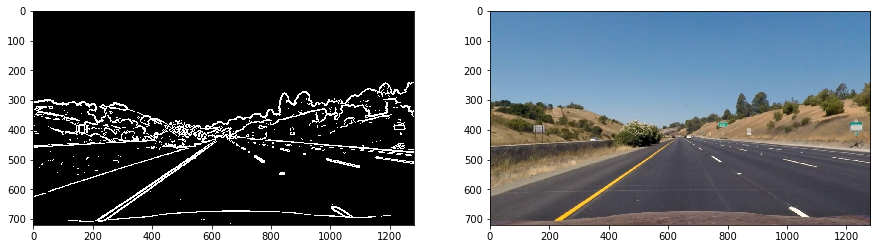

In [13]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.IntSlider(value = 255, min=0, max=255, step=1)
low_slider = widgets.IntSlider(value = 45, min=0, max=255, step=1)
kernel_slider = widgets.IntSlider(value = 11, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    sobMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    scaled_sobel = np.uint(255*sobMag/np.max(sobMag))
    binary_out = bin_channel(scaled_sobel,lowThreshold,highThreshold)
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Apply sobel in both direction (over V channel) and threshold over the direction

<function __main__.handle>

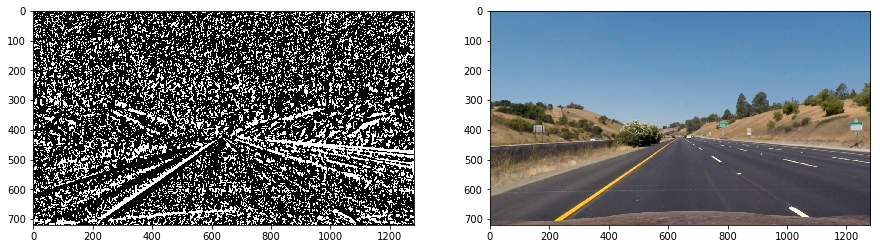

In [14]:
image = cv2.imread(images[0])
hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
vChannel = hsv[:,:,2]

high_slider = widgets.FloatSlider(value = 90, min=-180, max=180, step=1)
low_slider = widgets.FloatSlider(value = 50, min=-180, max=180, step=1)
kernel_slider = widgets.IntSlider(value = 21, min=3, max=31, step=2)

def handle(highThreshold, lowThreshold, kernel):
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=kernel)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=kernel)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    sobDirection = np.arctan2(sobely,sobelx)
    binary_out1 = bin_channel(sobDirection,lowThreshold*np.pi/180,highThreshold*np.pi/180)
    binary_out2 = bin_channel(sobDirection,-highThreshold*np.pi/180,-lowThreshold*np.pi/180)
    binary_out = binary_out1 | binary_out2
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_out,cmap='gray')
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))

widgets.interact(handle, highThreshold=high_slider, lowThreshold=low_slider, kernel=kernel_slider)

#### Combine x and y thresholds

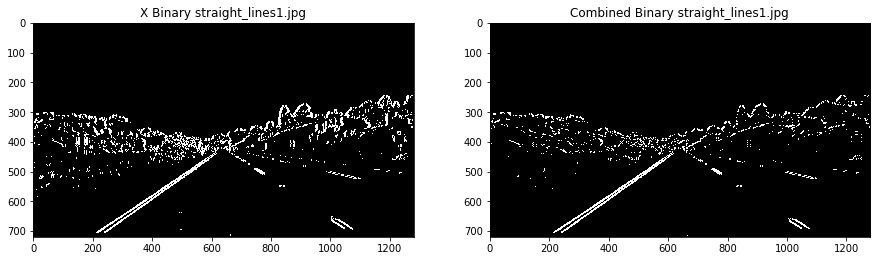

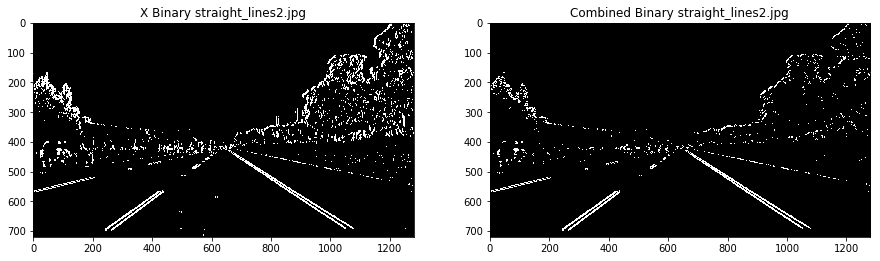

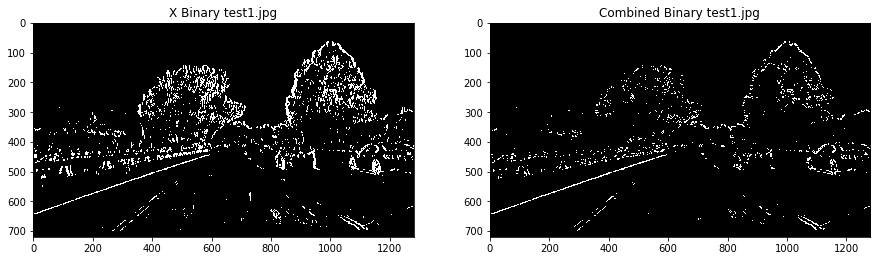

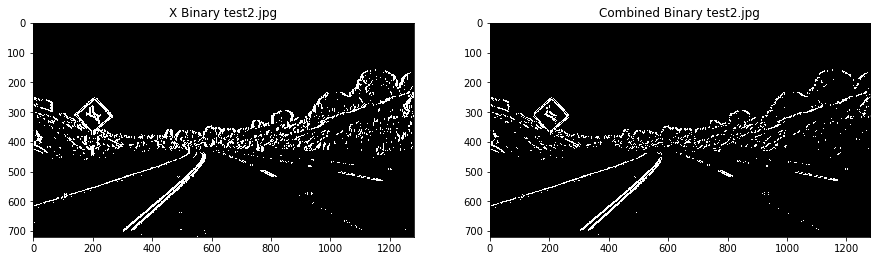

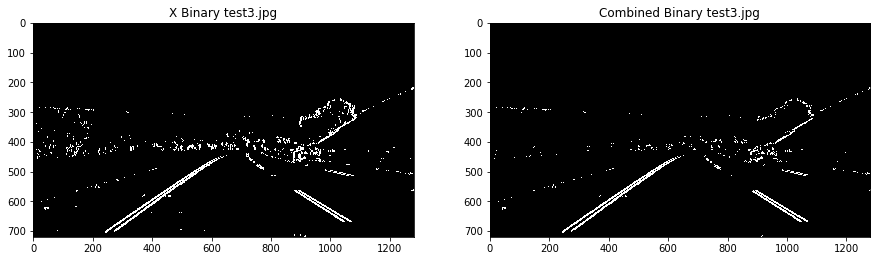

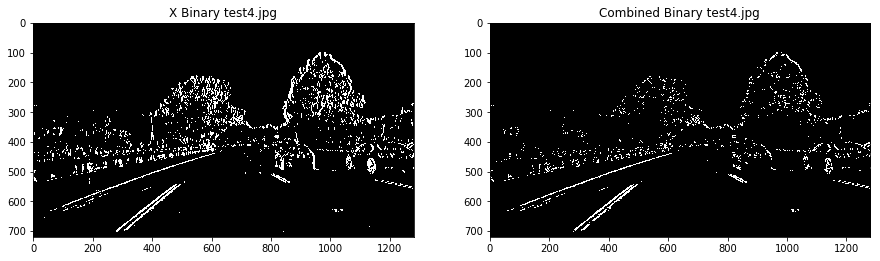

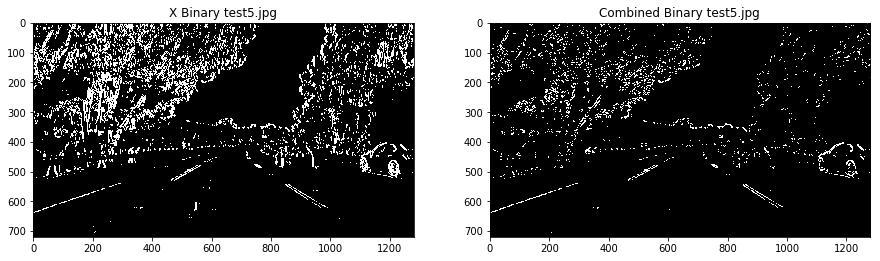

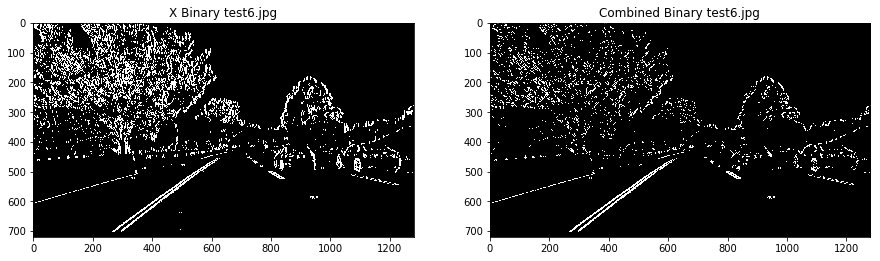

In [25]:
for fname in images:
    image = cv2.imread(fname)
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=11)
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    scaled_sobelx = np.uint(255*abs_sobelx/np.max(abs_sobelx))
    scaled_sobely = np.uint(255*abs_sobely/np.max(abs_sobely))
    
    binary_x = bin_channel(scaled_sobelx,30,255)
    binary_y = bin_channel(scaled_sobely,30,255)
    combined_binary = binary_x & binary_y
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(binary_x,cmap='gray')
    plt.title('X Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/combined_x_y/' + imageName[:-3] + 'bmp',combined_binary*255)

#### Combine magnitude and direction thresholds

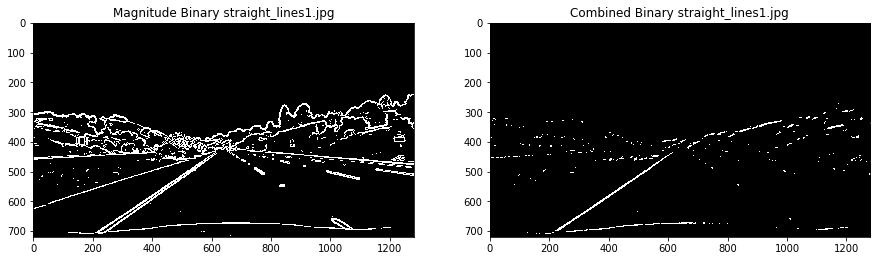

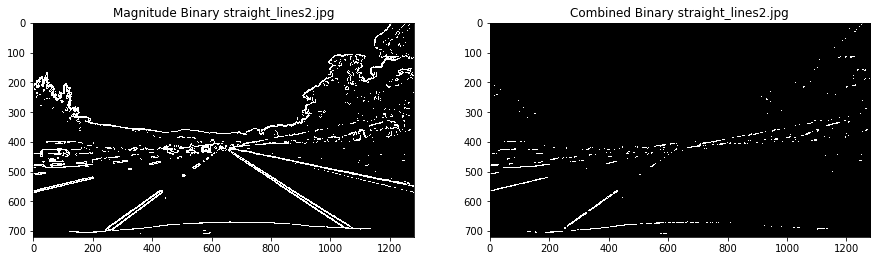

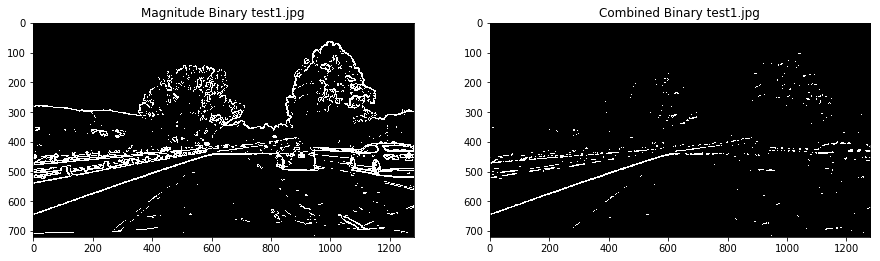

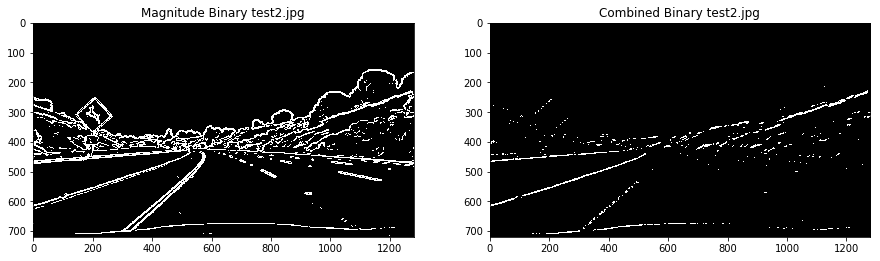

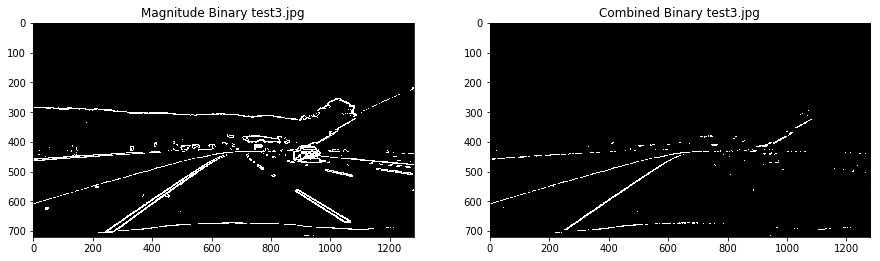

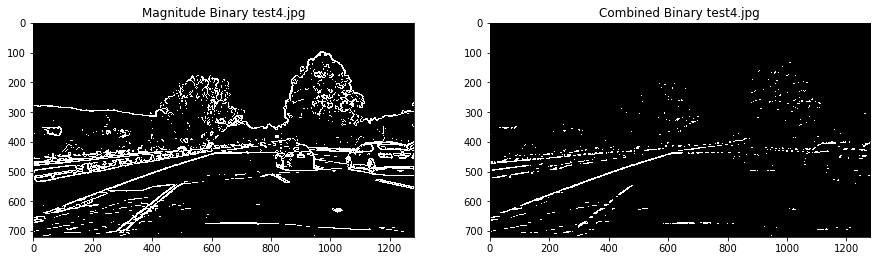

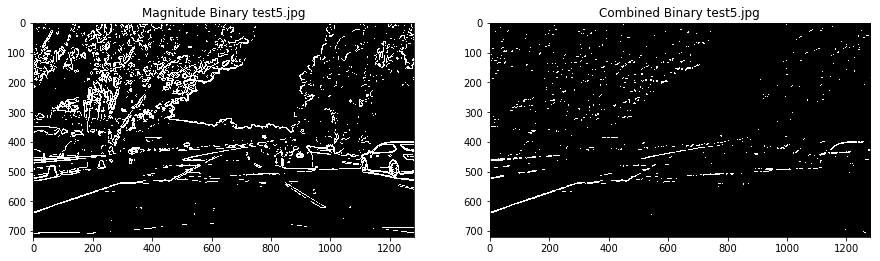

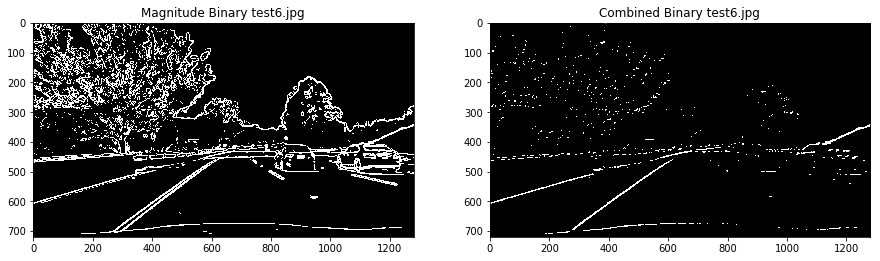

In [24]:
for fname in images:
    image = cv2.imread(fname)
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=11)
    sobMag = np.sqrt(np.square(sobelx)+np.square(sobely))
    scaledMag = np.uint(255*sobMag/np.max(sobMag))
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=21)
    sobely = cv2.Sobel(vChannel,cv2.CV_64F,0,1,ksize=21)
    sobDirection = np.arctan2(sobely,sobelx)
    
    mag_bin = bin_channel(scaledMag,45,255)
    dir_bin1 = bin_channel(sobDirection,50.0*np.pi/180.0,90*np.pi/180)
    dir_bin2 = bin_channel(mag_bin,-90.0*np.pi/180.0,-50*np.pi/180)
    combined_binary = mag_bin & (dir_bin1 | dir_bin2)
    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(mag_bin,cmap='gray')
    plt.title('Magnitude Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/combined_mag_dir/' + imageName[:-3] + 'bmp',combined_binary*255)

#### Combine selecteed thresholds - x and colors

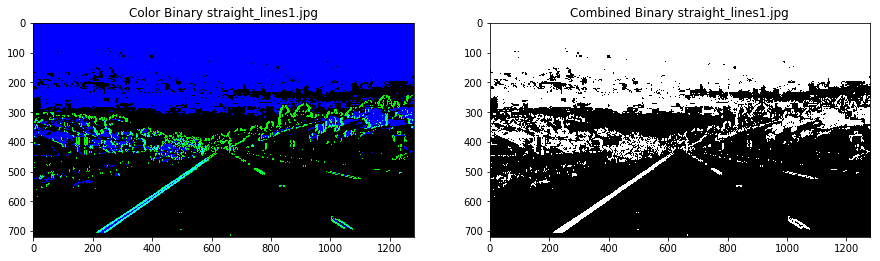

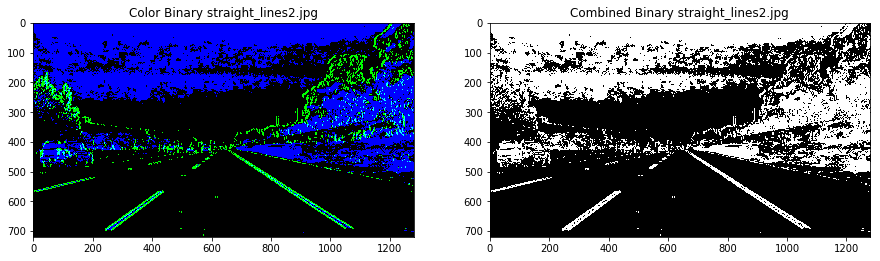

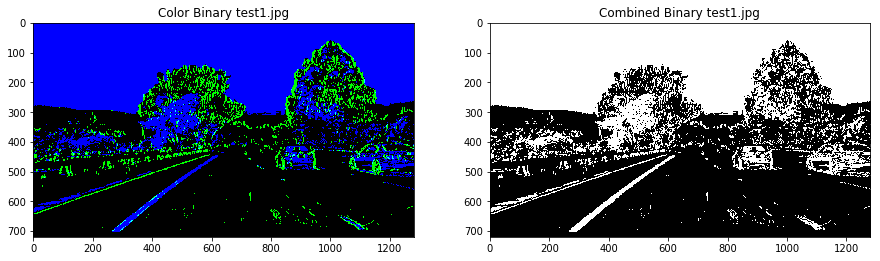

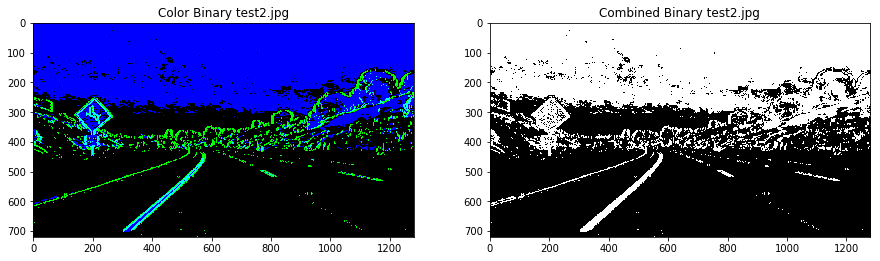

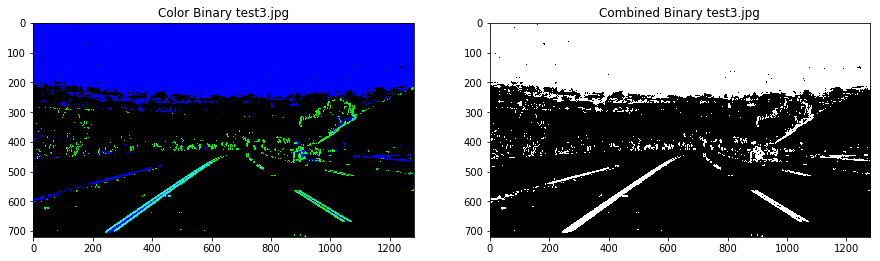

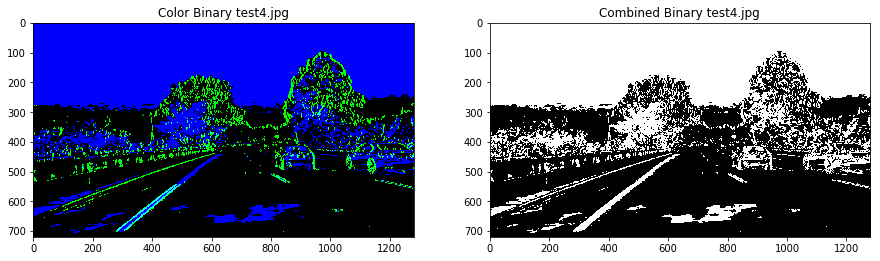

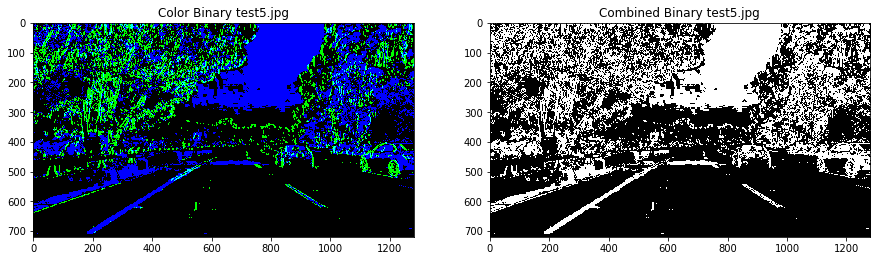

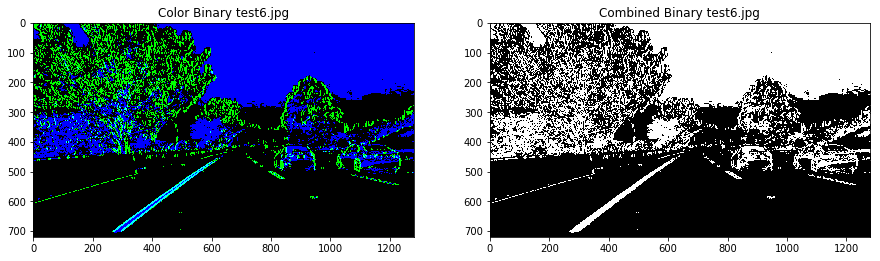

In [70]:
for fname in images:
    image = cv2.imread(fname)
    rChannel = image[:,:,2]
    hls = cv2.cvtColor(image,cv2.COLOR_BGR2HLS)
    sChannel = hls[:,:,2]
    hsv = cv2.cvtColor(image,cv2.COLOR_BGR2HSV)
    sChannel2 = hsv[:,:,1]
    vChannel = hsv[:,:,2]
    sobelx = cv2.Sobel(vChannel,cv2.CV_64F,1,0,ksize=11)
    abs_sobelx = np.absolute(sobelx)
    scaled_sobelx = np.uint(255*abs_sobelx/np.max(abs_sobelx))

    red_bin = bin_channel(rChannel,230,255)
    s_bin = bin_channel(sChannel,100,255)
    s_bin2 = bin_channel(sChannel2,120,255)
    binary_x = bin_channel(scaled_sobelx,30,255)
    combined_color_binary = red_bin | s_bin | s_bin2
    color_binary = np.dstack((np.zeros_like(binary_x), binary_x*255, combined_color_binary*255))
    combined_binary = combined_color_binary | binary_x

    imageName = fname.split('\\')[-1]
    fig = plt.figure(figsize = (15,8))
    ax1 = fig.add_subplot(1,2,1)
    plt.imshow(color_binary)
    plt.title('Color Binary ' + imageName)
    ax2 = fig.add_subplot(1,2,2)
    plt.imshow(combined_binary,cmap='gray')
    plt.title('Combined Binary ' + imageName)
    plt.show()  
    cv2.imwrite('./output_images/color_gradient_combined_binary/' + imageName[:-3] + 'bmp',combined_binary*255)
    cv2.imwrite('./output_images/color_gradient_colored_binary/' + imageName, cv2.cvtColor(color_binary,cv2.COLOR_RGB2BGR))



## 4. Apply a perspective transform to rectify binary image 

#### Choose the 4 points

In [126]:
# %matplotlib qt
# 
# straightBin = glob.glob('./output_images/color_gradient_combined_binary/straight_lines*.bmp')
# img = cv2.imread(straightBin[0])[:,:,0]
# plt.imshow(img,cmap='gray')

# Chosen 4 points
bot_left = [261,680]
top_left = [585,457]
top_right = [698,457]
bot_right = [1044,680]

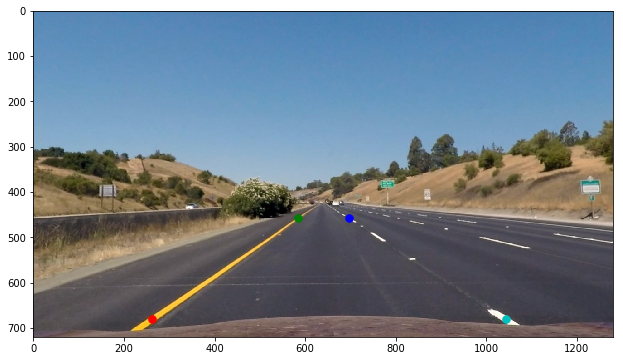

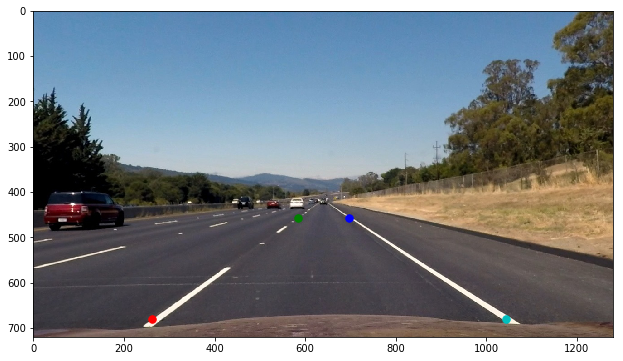

In [133]:
%matplotlib inline

for fname in straightImgs:
    img = cv2.imread(fname)
    fig = plt.figure(figsize = (12,6))
    plt.imshow(cv2.cvtColor(img,cv2.COLOR_BGR2RGB))
    plt.plot(bot_left[0],bot_left[1],'r.',markersize=15.0)
    plt.plot(top_left[0],top_left[1],'g.',markersize=15.0)
    plt.plot(top_right[0],top_right[1],'b.',markersize=15.0)
    plt.plot(bot_right[0],bot_right[1],'c.',markersize=15.0)
    imageName = fname.split('\\')[-1]
    plt.savefig('./output_images/chosen_points/' + imageName)

#### Transform the straight line images and check if they are indeed straight

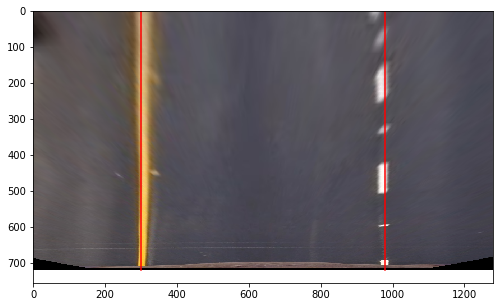

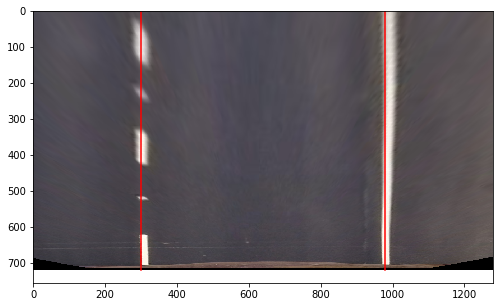

In [136]:
src = np.float32([bot_left,top_left,top_right,bot_right])
dst = np.float32([[300,700],[300,100],[980,100],[980,700]])

for fname in straightImgs:
    img = cv2.imread(fname)
    image_size = (img.shape[1],img.shape[0])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,image_size,flags=cv2.INTER_LINEAR)
    fig = plt.figure(figsize = (10,5))
    plt.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
    plt.plot([300,300],[0,720],'r')
    plt.plot([980,980],[0,720],'r')

#### Transform all images to see the curvature

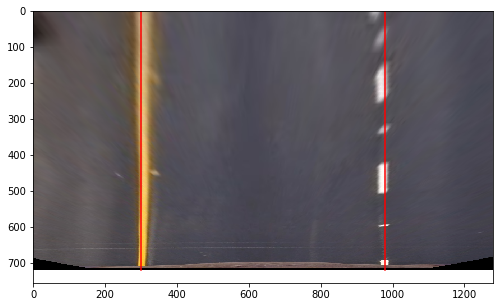

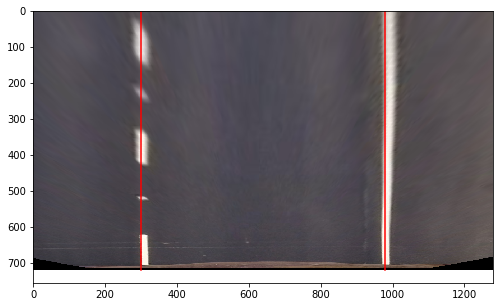

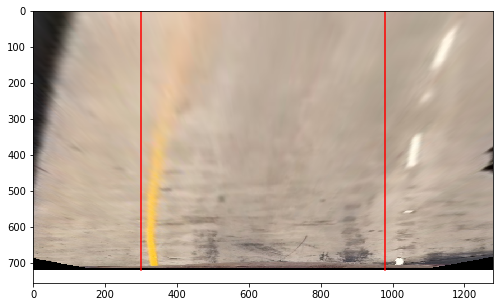

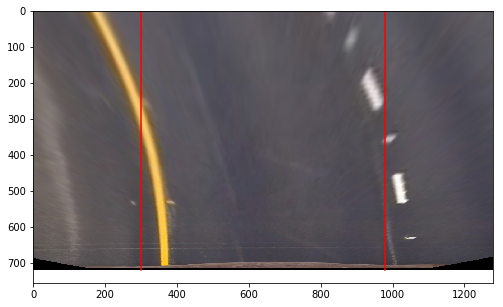

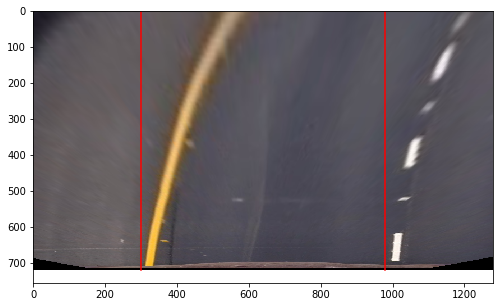

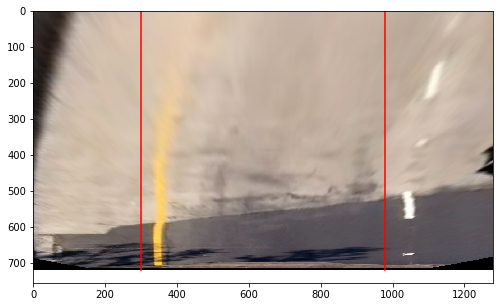

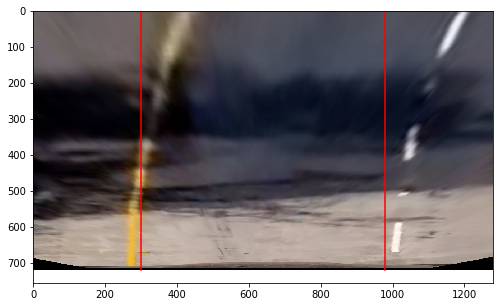

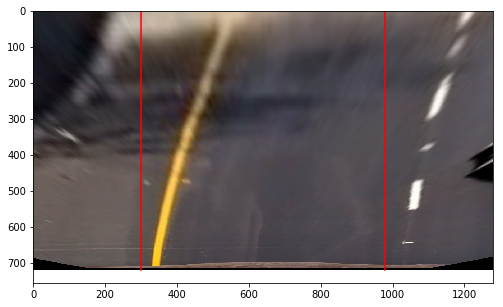

In [137]:
for fname in images:
    img = cv2.imread(fname)
    image_size = (img.shape[1],img.shape[0])
    M = cv2.getPerspectiveTransform(src,dst)
    warped = cv2.warpPerspective(img,M,image_size,flags=cv2.INTER_LINEAR)
    fig = plt.figure(figsize = (10,5))
    plt.imshow(cv2.cvtColor(warped,cv2.COLOR_BGR2RGB))
    plt.plot([300,300],[0,720],'r')
    plt.plot([980,980],[0,720],'r')
    plt.savefig('./output_images/transformed_images/' + imageName)
    